# Segment Anything Model (SAM)在遥感数据上的应用测试
4月6号，facebook发布一种新的语义分割模型，Segment Anything Model (SAM)。仅仅3天时间该项目在Github就收获了1.8万个star,火爆程度可见一斑。有人甚至称之为CV领域的GPT时刻。SAM都做了什么让大家如此感兴趣？


- SAM与传统单纯的语义分割方式不同，加入了Prompt机制，可以将文字、坐标点、坐标框等作为辅助信息优化分割结果，这一方面增加了交互的灵活性，另一方面这也是解决图像分割中尺度问题的一次有益尝试。
- 当在识别要分割的对象时遇到不确定性，SAM 能够生成多个有效掩码。
- SAM 的自动分割模式可以识别图像中存在的所有潜在对象并生成蒙版。
- 贡献了目前全球最大的语义分割数据集。


相信看到这些介绍后很多RSer会和我一样好奇SAM在遥感数据上应用效果如何，我们已经替大家先试了试，总体感觉不错。同时，构建了一个在线体验的APP：https://junchuanyu-segrs.hf.space，在线APP由于是CPU服务器速度相对慢，本地测试请看后面教程，公众号回复“sam”可以获取到测试用的影像和测试结果。


我一直人为智能交互解译是AI在遥感解译方面的短期发展目标，事实上在遥感领域已有不少成熟的产品在向这个方向努力，SAM的提出提供了一个有价值的参考，目前SAM更可能作为一种基础模型在细分领域迭代，相信很快会有基于SAM展开的遥感相关的研究出现，让我们拭目以待。

## 1. 环境配置

环境配置相对简单，安装好torch环境，从SAM官方github中克隆SegmentAnything代码，并下载模型文件，并安装Opencv集ipywidgets等必要的库函数即可。

In [468]:
# 导入必要的库函数
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2
import os
import ipywidgets as widgets
import sys
import glob
from segment_anything import sam_model_registry, SamPredictor
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor


## 2. 交互式分割

SAM提供了两种分割方式，一种是在提示信息辅助下以交互形式进行分割，另一种是全自动分割。前者更有针对性适合小场景，后者更适合大范围应用。

In [339]:
# 定义可视化函数
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   


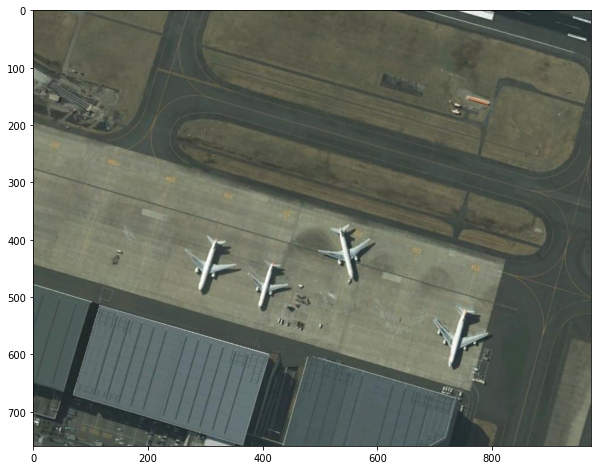

In [402]:
# 显示一个机场的影像
image = cv2.imread('./test/test.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10,10))
plt.imshow(image)

### 2.1 交互式选点

交互式预测需要提示信息，这里的提示信息分为三类，文本、坐标点和坐标框。我们以比较直观的坐标点为例进行演示。首先要构建一个能个交互场景下选点的工具

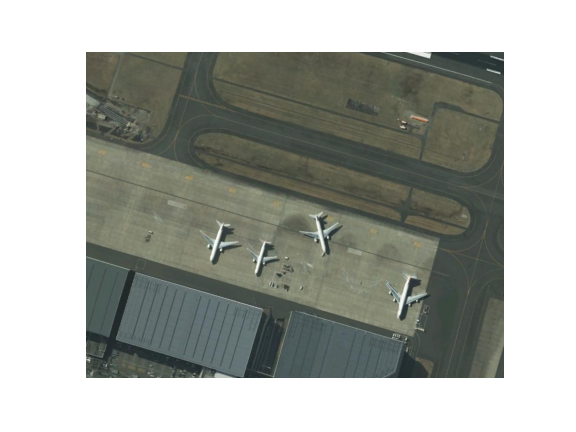

[161.68633533559188]
[161.68633533559188, 877.0407626105491]


In [433]:
# 用来实现交互式选点，实时显示点的图像坐标
def onclick(event):

    ax.clear()
    ax.imshow(image)
    ax.scatter(event.xdata, event.ydata, s=100, color='red')
    plt.draw()
    x_slider.value = event.xdata
    y_slider.value = event.ydata
    pointx.append(x_slider.value)
    pointy.append(y_slider.value)
    print(pointx)
# Update the position of the point when slider values are changed
def on_value_change(change):
    ax.clear()
    ax.imshow(image)
    ax.scatter(x_slider.value, y_slider.value, s=100, color='red')
    # plt.draw()
    
#必须加上这一行，否则无法显示交互式界面
%matplotlib widget 
pointx=[]
pointy=[]
fig, ax = plt.subplots(figsize=(8,6))
ax.imshow(image)
plt.axis('off')
# Initialize the slider variables with the coordinates of the center of the picture
x_slider = widgets.FloatSlider(min=0, max=image.shape[1], step=1,description='X:', value=image.shape[1] // 2)
y_slider = widgets.FloatSlider(min=0, max=image.shape[0], step=1,description='Y:', value=image.shape[0] // 2)
x_slider.observe(on_value_change, names='value')
y_slider.observe(on_value_change, names='value')
cid = fig.canvas.mpl_connect('button_press_event', onclick)



In [434]:
%matplotlib inline

[[161.68633534  72.98191204]
 [877.04076261 201.13987133]]


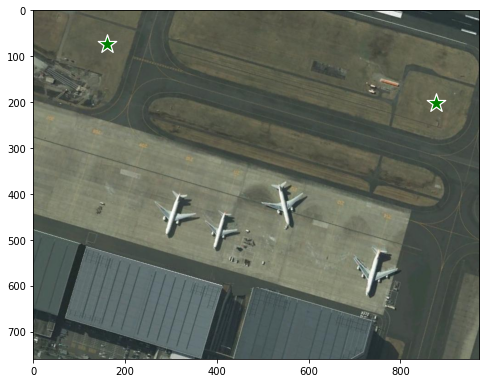

In [435]:
#通过交互工具选点，将坐标点显示在影像上
tmp=list(zip(pointx,pointy))
input_point = np.array(tmp)
input_label = np.zeros(input_point.shape[0])+1 # 1 for positive, 0 for negative
print(input_point)
plt.figure(figsize=(8,8))
plt.imshow(image)
show_points(input_point, input_label, plt.gca())
plt.show()  

### 2.2 生成掩膜

加载交互式预测模型，并基于选取的点，对图像进行分割

In [457]:
# load模型文件，定义预测模型为Sampredictor即交互式预测
sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"
device = "cuda"
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)
predictor = SamPredictor(sam)
predictor.set_image(image) # embedding操作
# 预测效率较高v100显卡大概3s完成预测
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,)

In [437]:
#当multimask_output设置为True时，模型将根据不同的预测概率输出三个mask结果，如果设置为False将直接输出一个自有结果
len(masks)

3

可以看到三个mask对应尺度是不同，每个结果都具有较好的语义信息

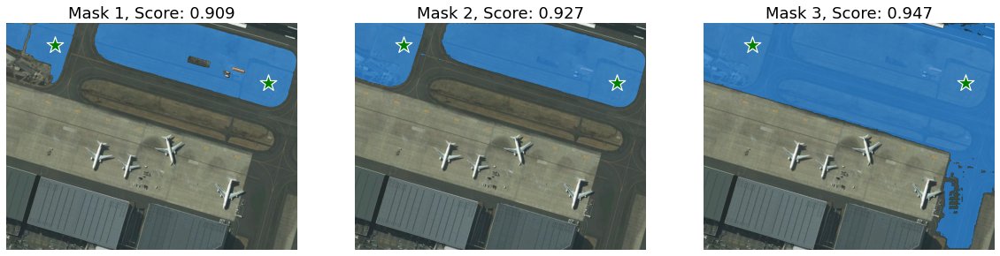

In [438]:
plt.figure(figsize=(20,15))

for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.subplot(1,3,i+1)
    plt.imshow(image)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
plt.show()  
  

### 2.3 补充辅助信息

我们再增加一些负样本作为辅助信息来强化对目标的分割，这里假设我们想提取图像上部的水泥地部分，因此在图中右下角的水泥地增加负样本

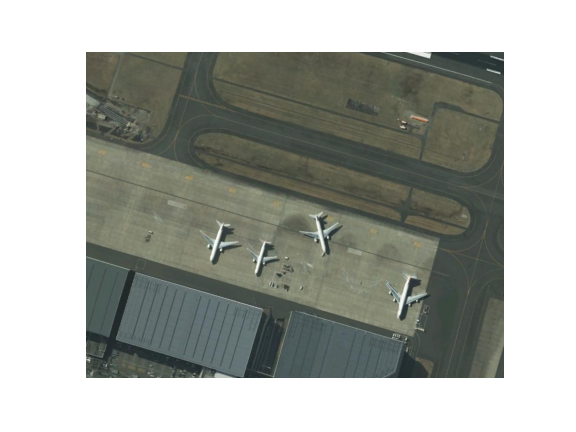

[856.0694601822929]


In [439]:
%matplotlib widget
pointx=[]
pointy=[]
fig, ax = plt.subplots(figsize=(8,6))
ax.imshow(image)
plt.axis('off')
# Initialize the slider variables with the coordinates of the center of the picture
x_slider = widgets.FloatSlider(min=0, max=image.shape[1], step=1,description='X:', value=image.shape[1] // 2)
y_slider = widgets.FloatSlider(min=0, max=image.shape[0], step=1,description='Y:', value=image.shape[0] // 2)

x_slider.observe(on_value_change, names='value')
y_slider.observe(on_value_change, names='value')

cid = fig.canvas.mpl_connect('button_press_event', onclick)


In [440]:
%matplotlib inline

In [441]:
# 切记将前面已经选的正样本点和后面选的负样本点合并在一起
tmp1=list(zip(pointx,pointy))
input_point = np.array(tmp+tmp1)
labtmp=list(np.ones(len(tmp)))+list(np.zeros(len(tmp1))) #label 设置为0表示为背景信息，需要被排除掉,设置为1表示增加正样本点
input_label=np.array(labtmp)
mask_input = logits[np.argmax(scores), :, :]  # Choose the model's best mask

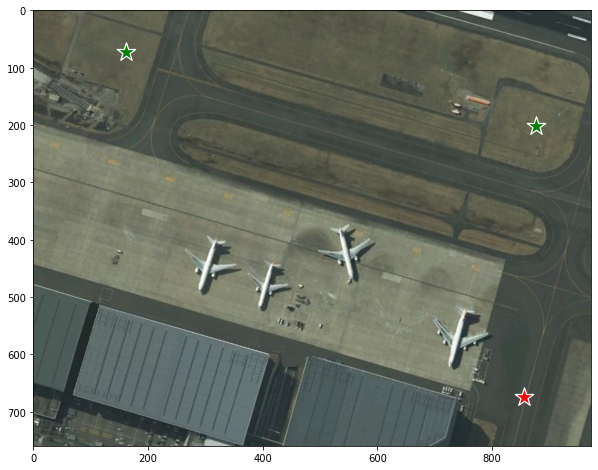

In [442]:
# 通过交互工具选择三个点，作为想要剔除的背景辅助信息
plt.figure(figsize=(10,10))
plt.imshow(image)
show_points(input_point, input_label, plt.gca())
plt.show() 

In [449]:
predictor.set_image(image) # embedding操作

masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,)
# 当multimask_output设置为False时可以按照下面语句输出单个mask结果
# plt.figure(figsize=(10,10))
# plt.imshow(image)
# show_mask(masks, plt.gca())
# show_points(input_point, input_label, plt.gca())
# plt.title(f"Mask {i+1}, Score: {scores[0]:.3f}", fontsize=18)
# plt.show()  

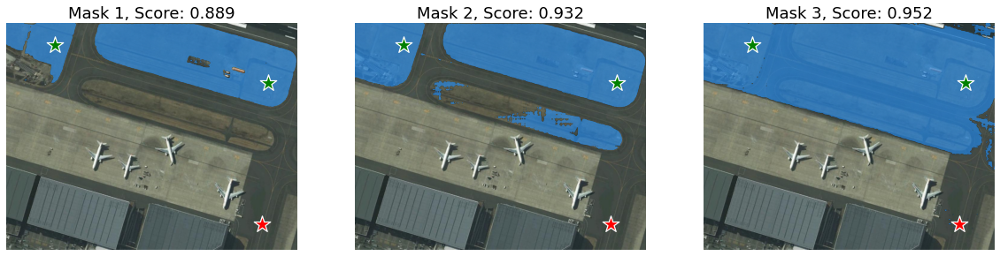

In [450]:
# 灵活运用交互选点工具，补充正负样本可以让模型更好的识别出想要的目标
plt.figure(figsize=(20,15))
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.subplot(1,3,i+1)
    plt.imshow(image)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
plt.show()  

## 3. 自动式分割

原理是在图像上生成等距离格网，每个点都作为提示信息，SAM可以从每个提示中预测多个掩码。 然后，使用non-maximal suppression对掩膜结果进行过滤和优化

### 3.1 自动分割

In [451]:
#实例分割的掩膜是由多个多边形组成的，可以通过下面的函数将掩膜显示在图片上
def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)
    polygons = []
    color = []
    for ann in sorted_anns:
        m = ann['segmentation']
        img = np.ones((m.shape[0], m.shape[1], 3))
        color_mask = np.random.random((1, 3)).tolist()[0]
        for i in range(3):
            img[:,:,i] = color_mask[i]
        ax.imshow(np.dstack((img, m*0.35)))
    

In [459]:
#加载模型文件并定义预测模型为SamAutomaticMaskGenerator
# sam_checkpoint = "sam_vit_h_4b8939.pth"
# model_type = "vit_h"
# device = "cuda"
# sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
# sam.to(device=device)
mask_generator = SamAutomaticMaskGenerator(sam)
masks = mask_generator.generate(image)

In [460]:
#此时masks包含多种信息，segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'分别代表掩膜文件、多边形、坐标框、iou、采样点、得分、裁剪框
print(len(masks)) #多边形个数，数值越大，分割粒度越小
print(masks[0].keys())

69
dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


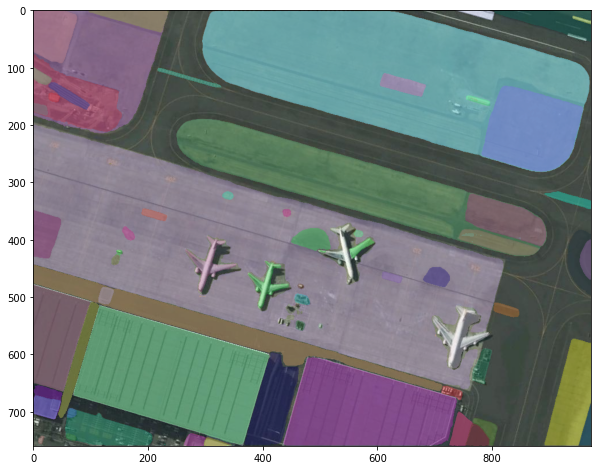

In [472]:
plt.figure(figsize=(10,10))
plt.imshow(image)
show_anns(masks) #显示过程较慢
plt.show() 

### 3.2 自动分割参数优化

遥感数据具有多尺度的特点，全自动分割对于某些尺度较小的目标提取效果并不好，比如下面整个案例

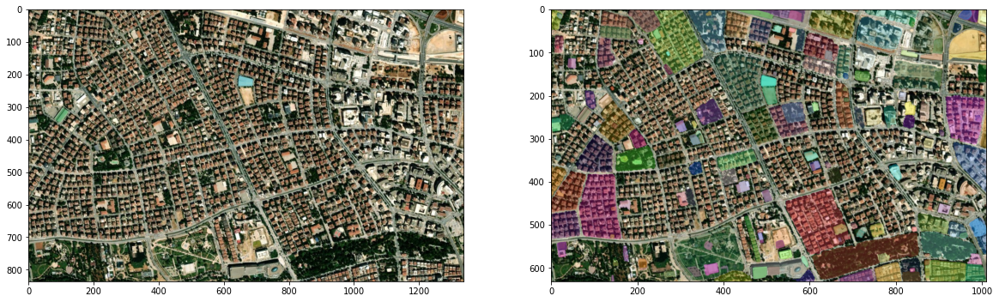

In [477]:
img = cv2.imread('./test/test2.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
lab = cv2.imread('./test/test2_out.png')

plt.figure(figsize=(20,15))
plt.subplot(1,2,1)
plt.imshow(img)
plt.subplot(1,2,2)
plt.imshow(lab)
plt.show()


SamAutomaticMaskGenerator中有几个可调参数，用于控制采样点的密度以及去除低质量或下面积的空洞，通过调节这些参数可以改善提取效果

In [461]:
mask_generator_2 = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=64, #默认32
    pred_iou_thresh=0.8, #默认0.98
    stability_score_thresh=0.9, #默认0.95
    crop_n_layers=1,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=10,  # Requires open-cv to run post-processing
)

In [35]:
# 参数调节过大会导致运行速度很慢，酌情处理
masks2 = mask_generator_2.generate(image)
len(masks2)

2204

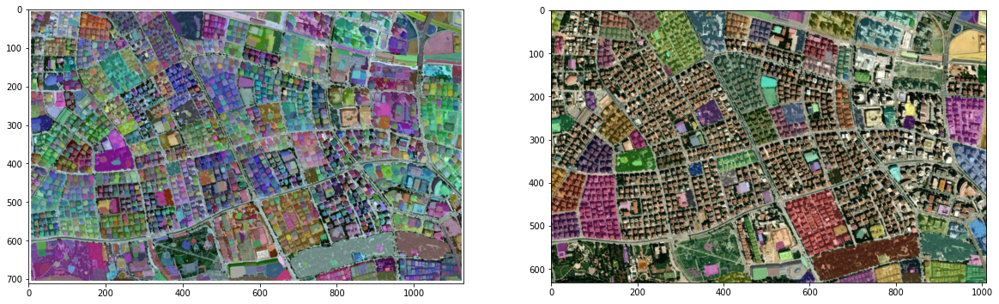

In [478]:
plt.figure(figsize=(20,15))
plt.subplot(1,2,1)
show_anns(masks2)
plt.subplot(1,2,2)
plt.imshow(lab)
plt.show()

## 4. 不同遥感影像分割案例

选择一些遥感影像进行测试，基本包含了常见的一些场景

In [495]:
def segment_image(image,out):
    masks = mask_generator.generate(image)
    plt.clf()
    ppi = 100
    height, width, _ = image.shape
    plt.figure(figsize=(width / ppi, height / ppi), dpi=ppi)
    plt.imshow(image)
    show_anns(masks)
    plt.axis('off')
    plt.savefig(out, bbox_inches='tight', pad_inches=0)


In [ ]:
filelist=glob.glob('./images/*')

for file in filelist[9:16]:
    root,filename = os.path.split(file)
    basename,ext = os.path.splitext(filename)
    output_file = os.path.join('./images/',basename+'_out.png')   
    image = cv2.imread(file)
    segment_image(image,output_file)

In [509]:
def read_img(url,rgb=True):
    img = cv2.imread(url)
    if rgb:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return np.resize(img,(900,600))

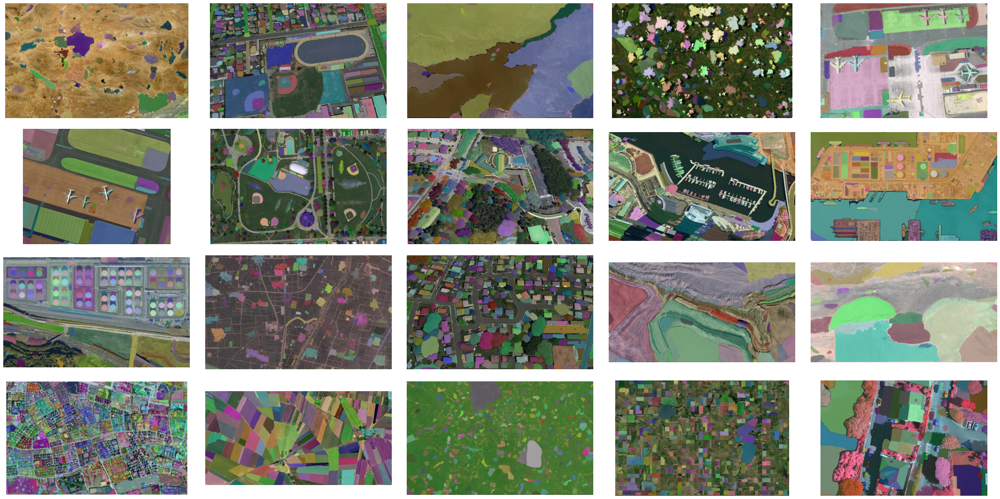

In [523]:
result=glob.glob('./result/*')
images = []

for i in range(20):
    image = read_img(result[i],rgb=False)
    images.append(image)

# Create plot with 4 rows and 5 columns
fig, axs = plt.subplots(nrows=4, ncols=5, figsize=(30,15))
fig.tight_layout(pad=0.2)
# Iterate through images and plot each one
for i, ax in enumerate(axs.flat):
    ax.imshow(images[i], cmap='gray')
    ax.axis('off')
plt.show()

## 5. 总结
facebook发布SAM模型的同时也发布了全球迄今为止最大的语义分割数据集，其中大量标签数据正是通过SAM的交互式分割而迭代形成的。训练数据中以自然图像为主，并不包含遥感数据，但从实验结果看该确实对遥感数据也有一定效果，这也许是“大力出奇迹”的又一次胜利。但仔细看分割结果还存在不少问题，虽然优化模型参数能取得更好的效果但很大程度影响计算效率。SAM从表面上看与超像素分割+CNN的模式有些类似，但识别边界和场景理解更准确，然而对于小尺度的目标，尤其是线状地物依然难以实现精确分割。SAM的根本性创新在于prompt的加入，相信后续可以迭代出更多的玩法。目前，SAM的更适用于作为基础模型提供一种辅助信息，与现有的分割算法相结合相互补充。